# NVIDIA RAPIDS on Azure ML
## MLADS Fall'19

In this notebook we use NYC Taxi dataset to showcase some graph capabilities of RAPIDS using `cugraph`. We also further showcase how to effectively use the `apply_rows` functionality and write custom kernels for extracting useful information or converting between data points representations. Finally, we will use `cuXfilter` and `cudatashader` to showcase visual capabilities of RAPIDS.

**AUTHORS**
* Tom Drabas (Microsoft)
* Brad Rees (NVIDIA)
* Keith Kraus (NVIDIA)
* Paul Mahler (NVIDIA)
* John Zalewski (NVIDIA)
* Chau Dang (NVIDIA)

**FURTHER TEAM**
* Joshua Patterson (NVIDIA)
* Michael Beaumont (NVIDIA)

# Import modules

In [4]:
import numpy as np
import pandas as pd
import math

import cudf
import cugraph

import os
from collections import OrderedDict
import argparse
import datetime

%load_ext autotime

# Load, clean and featurize data

In [5]:
def day_of_the_week_kernel(day, month, year, day_of_week):
    for i, (d_1, m_1, y_1) in enumerate(zip(day, month, year)):
        if month[i] < 3:
            shift = month[i]
        else:
            shift = 0
        Y = year[i] - (month[i] < 3)
        y = Y - 2000
        c = 20
        d = day[i]
        m = month[i] + shift + 1
        day_of_week[i] = (d + math.floor(m * 2.6) + y + (y // 4) + (c // 4) - 2 * c) % 7

time: 2.84 ms


In [6]:
def add_features(df):
    df['hour'] = df['pickup_datetime'].dt.hour
    df['year'] = df['pickup_datetime'].dt.year
    df['month'] = df['pickup_datetime'].dt.month
    df['day'] = df['pickup_datetime'].dt.day
    df['diff'] = df['dropoff_datetime'].astype('int64') - df['pickup_datetime'].astype('int64')
    
    df = df.apply_rows(
        day_of_the_week_kernel
        , incols = ['day', 'month', 'year']
        , outcols = {'day_of_week': np.int32}
        , kwargs = {}
    )

    df = df.drop('pickup_datetime')
    df = df.drop('dropoff_datetime')
        
    return df

time: 7.61 ms


In [7]:
columns_dtypes = OrderedDict(
    [
        ('vendor_id', 'int32'),
        ('pickup_datetime', 'date'),
        ('dropoff_datetime', 'date'),
        ('passenger_count', 'int32'),
        ('trip_distance', 'int32'),
        ('pickup_longitude', 'float64'),
        ('pickup_latitude', 'float64'),
        ('rate_code', 'int32'),
        ('store_and_fwd_flag', 'int32'),
        ('dropoff_longitude', 'float64'),
        ('dropoff_latitude', 'float64'),
        ('payment_type', 'int32'),
        ('fare_amount', 'float64'),
        ('extra', 'float64'),
        ('mta_tax', 'float64'),
        ('tip_amount', 'float64'),
        ('tolls_amount', 'float64'),
        ('surcharge', 'float64'),
        ('total_amount', 'float64')
    ]
)

use_col  = [
    'pickup_datetime',
    'dropoff_datetime',
    'passenger_count', 
    'pickup_longitude',
    'pickup_latitude',     
    'dropoff_longitude',
    'dropoff_latitude',
    'trip_distance'
]

time: 7.06 ms


In [8]:
data_dir = '../../'
data_path = os.path.join(data_dir, "data/nyctaxi")

files = ['yellow_tripdata_2016-01.csv']#, 'yellow_tripdata_2016-02.csv', 'yellow_tripdata_2016-03.csv', 'yellow_tripdata_2016-04.csv']

data = []

for f in files:
    data.append(
        cudf.read_csv(
            os.path.join(data_path, f'2016/{f}')
            , names=list(columns_dtypes.keys())
            , dtype=list(columns_dtypes.values())
            , skip_rows=1
            , usecols=use_col
        )
    )
    
taxi_df = cudf.concat(data)
del data   ### CLEAN UP 

time: 2.97 s


In [9]:
taxi_df.head()

,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
0,1969-12-31 23:59:59.999,1969-12-31 23:59:59.999,1000,13001012,7.027659e+15,7.027659e+14,5.930090e+16,5.930090e+15
1,2016-01-01 00:00:00.000,2016-01-01 00:00:00.000,2,1,-7.399037e+01,4.073470e+01,-7.398184e+01,4.073241e+01
2,2016-01-01 00:00:00.000,2016-01-01 00:00:00.000,5,4,-7.398078e+01,4.072991e+01,-7.394447e+01,4.071668e+01
3,2016-01-01 00:00:00.000,2016-01-01 00:00:00.000,1,10,-7.398455e+01,4.067957e+01,-7.395027e+01,4.078893e+01
4,2016-01-01 00:00:00.000,2016-01-01 00:00:00.000,1,4,-7.399347e+01,4.071899e+01,-7.396224e+01,4.065733e+01


time: 73.6 ms


In [10]:
print(f'Raw number of rows: {len(taxi_df):,}')

Raw number of rows: 10,906,859
time: 850 µs


In [11]:
# filter out records with missing or outlier values
query_frags = ("(passenger_count > 0 and passenger_count < 6) " +
        "and (pickup_longitude > -75 and pickup_longitude < -73) " +
        "and (dropoff_longitude > -75 and dropoff_longitude < -73) " +
        "and (pickup_latitude > 40 and pickup_latitude < 42) " +
        "and (dropoff_latitude > 40 and dropoff_latitude < 42)" +
        "and (pickup_latitude  != dropoff_latitude) " +     ### THERE'S SOME DATA POINTS
        "and (pickup_longitude != dropoff_longitude)"       ### WITH THE SAME PICKUP AND DROPOFF LOCs
    )

taxi_df = taxi_df.query(query_frags)

time: 712 ms


In [12]:
taxi_df = add_features(taxi_df)

time: 1.04 s


In [13]:
taxi_df.head().to_pandas()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,hour,year,month,day,diff,day_of_week
1,2,1,-73.990372,40.734695,-73.981842,40.732407,0,2016,1,1,0,5
2,5,4,-73.980782,40.729912,-73.944473,40.716679,0,2016,1,1,0,5
3,1,10,-73.984550,40.679565,-73.950272,40.788925,0,2016,1,1,0,5
4,1,4,-73.993469,40.718990,-73.962242,40.657333,0,2016,1,1,0,5
5,3,1,-73.960625,40.781330,-73.977264,40.758514,0,2016,1,1,0,5


time: 51.5 ms


In [14]:
print(f'Filtered number of rows: {len(taxi_df):,}')

Filtered number of rows: 10,301,832
time: 675 µs


# Building and analyzing graph
## Create list of nodes

In [15]:
nodes = [
      taxi_df[['pickup_longitude', 'pickup_latitude']].drop_duplicates().rename({'pickup_longitude': 'long', 'pickup_latitude': 'lat'})
    , taxi_df[['dropoff_longitude', 'dropoff_latitude']].drop_duplicates().rename({'dropoff_longitude': 'long', 'dropoff_latitude': 'lat'})
]

nodes = cudf.concat(nodes).drop_duplicates().reset_index(drop=True).reset_index().rename({'index': 'id'})
nodes.head().to_pandas()

,id,long,lat
0,0,-74.953789,40.117542
1,1,-74.951286,41.628445
2,2,-74.888176,40.634659
3,3,-74.884857,40.496296
4,4,-74.867722,40.498024


time: 761 ms


In [16]:
print('Total number of geo points in the dataset: {0:,}'.format(len(nodes)))

Total number of geo points in the dataset: 14,979,049
time: 839 µs


## Create a list of edges

In [17]:
edges = (
    taxi_df[['pickup_longitude', 'pickup_latitude','dropoff_longitude', 'dropoff_latitude', 'trip_distance']]
    .drop_duplicates()
    .rename({'pickup_longitude': 'long', 'pickup_latitude': 'lat'})
    .merge(nodes, on=['lat', 'long'])
    .rename({'long': 'pickup_longitude', 'lat': 'pickup_latitude', 'id': 'pickup_id', 'dropoff_longitude': 'long', 'dropoff_latitude': 'lat'})
    .merge(nodes, on=['lat', 'long'])
    .rename({'long': 'dropoff_longitude', 'lat': 'dropoff_latitude', 'id': 'dropoff_id'})
)[['pickup_id', 'dropoff_id', 'trip_distance']]

edges.head().to_pandas()

,pickup_id,dropoff_id,trip_distance
0,4790232,50688,3
1,332821,50689,0
2,406636,50690,1
3,1956396,50691,2
4,363955,50701,0


time: 542 ms


In [18]:
sources      = edges['pickup_id'].astype('int32')
destinations = edges['dropoff_id'].astype('int32')
distances    = edges['trip_distance'].astype('int32')

g = cugraph.Graph()
g.add_edge_list(sources, destinations, None)

time: 6.18 ms


## Graph distribution of degrees

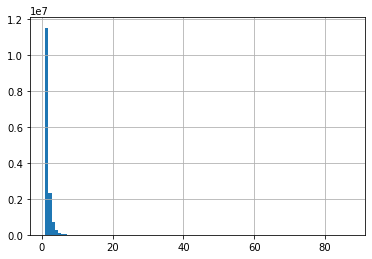

time: 1.48 s


In [19]:
%matplotlib inline
g.degree().to_pandas()['degree'].hist(bins=100)

## Pagerank

In [20]:
page = cugraph.pagerank(g, alpha=.85, max_iter=1000, tol=1.0e-05)

time: 197 ms


In [21]:
page.sort_values(by='pagerank', ascending=False).head(5).to_pandas()


,vertex,pagerank
2833905,2833905,0.000002
14708019,14708019,0.000001
2820565,2820565,0.000001
1486790,1486790,0.000001
1483586,1483586,0.000001


time: 112 ms


## Jaccard similarity

In [22]:
df = cugraph.jaccard(g)
df.sort_values(by='jaccard_coeff', ascending=False).head()

,source,destination,jaccard_coeff
9215393,13101550,11851817,0.166667
2745108,3791150,927220,0.125000
5437036,7397945,2882526,0.090909
0,1,1032505,0.000000
1,5,8,0.000000


time: 171 ms


# Visualize the trips

## Heatmap of dropoff points

In [23]:
import math

def degrees_to_2d(lon_in, lat_in, x, y):
    for i, (lon, lat) in enumerate(zip(lon_in, lat_in)):
        x[i] = lon * 20037508.34 / 180
        temp = math.log(math.tan((90 + lat) * math.pi / 360)) / (math.pi / 180)
        y[i] = temp * 20037508.34 / 180
        
taxi_2d = taxi_df[['dropoff_longitude', 'dropoff_latitude', 'passenger_count', 'hour', 'day_of_week', 'month']]
taxi_2d = taxi_2d.apply_rows(
      degrees_to_2d
    , incols = {'dropoff_longitude': 'lon_in', 'dropoff_latitude': 'lat_in'}
    , outcols = {'x': np.float64, 'y': np.float64}
    , kwargs = {}
)

taxi_2d['passenger_count'] = taxi_2d['passenger_count'].astype('float64')

time: 637 ms


In [24]:
# Overloading Datashader functions
import cudatashader as ds
from cudatashader import transfer_functions as tf
from cudatashader.colors import Hot

# t0 = time.time() # Save start time
cvs = ds.Canvas(plot_width=750, plot_height=625, x_range=(-8239910.23,-8229529.24), y_range=(4968481.34,4983152.92)) # Create canvas
agg = cvs.points(taxi_2d, 'x', 'y', ds.count('passenger_count')) # Perform aggregation
img = tf.shade(agg, cmap=Hot, how='eq_hist') # Produce image from aggregation

time: 6.09 s


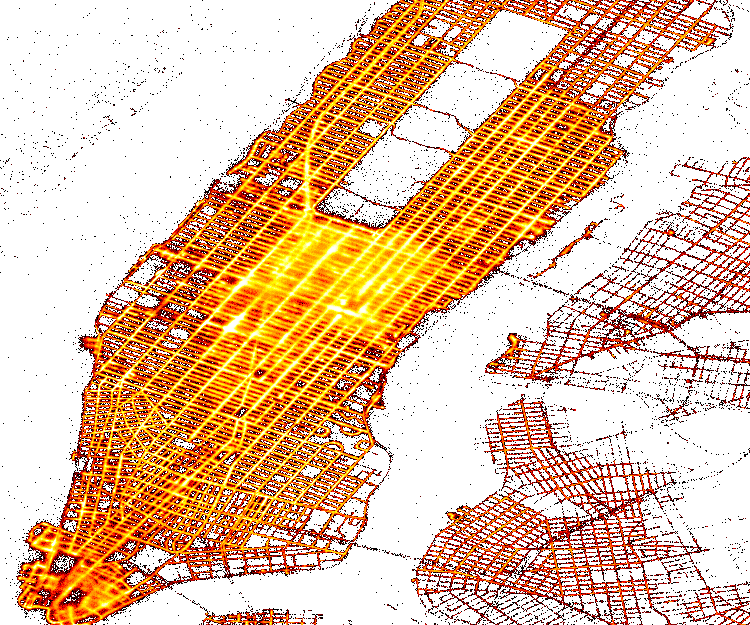

time: 392 ms


In [25]:
img

## Interactive visualization of millions of data points

In [26]:
import cuXfilter
from cuXfilter import charts

time: 1.69 s


In [27]:
cux_df = cuXfilter.DataFrame.from_dataframe(taxi_2d)

time: 42.8 ms


In [28]:
label_map = {0: 'Sunday', 1: 'Monday',    2: 'Tuesday',    3: 'Wednesday',   4: 'Thursday',    5: 'Friday',    6: 'Saturday',    9: 'Unknown'}
red_blue_palette = [ (49,130,189), (107,174,214), (123, 142, 216), (226,103,152), (255,0,104) , (50,50,50) ]

chart1 = charts.cudatashader.scatter_geo(
      x='x'
    , y='y'
    , aggregate_fn='count'
    , x_range=(-8239910.23,-8229529.24), y_range=(4968481.34,4983152.92)
    , color_palette=red_blue_palette
)

chart2 = charts.panel_widgets.multi_select('month')
chart3 = charts.bokeh.bar('passenger_count', data_points=5)
chart4 = charts.bokeh.bar('day_of_week', x_label_map=label_map)

time: 3.38 ms


In [29]:
d = cux_df.dashboard([chart1, chart2, chart3, chart4], layout=cuXfilter.layouts.feature_and_double_base, theme=cuXfilter.themes.light, title= 'NYC TAXI DATASET')

time: 2.27 s


In [30]:
import socket
d.show(f'{socket.gethostname()}:8778')

time: 123 ms


In [33]:
print(f'Dashboard available at http://{socket.gethostname()}:8778')

Dashboard available at http://cds-gpu:8778
time: 820 µs


ERROR:error handling message
 message: Message 'PATCH-DOC' (revision 1) content: {'events': [{'kind': 'ModelChanged', 'model': {'type': 'Range1d', 'id': '1005'}, 'attr': 'start', 'new': -8163187.377947866}], 'references': []} 
 error: ValueError('Maximum allowed dimension exceeded',)
Traceback (most recent call last):
  File "/opt/conda/envs/rapids/lib/python3.6/site-packages/bokeh/server/protocol_handler.py", line 100, in handle
    work = yield handler(message, connection)
  File "/opt/conda/envs/rapids/lib/python3.6/site-packages/tornado/gen.py", line 735, in run
    value = future.result()
  File "/opt/conda/envs/rapids/lib/python3.6/site-packages/tornado/gen.py", line 748, in run
    yielded = self.gen.send(value)
  File "/opt/conda/envs/rapids/lib/python3.6/site-packages/bokeh/server/session.py", line 70, in _needs_document_lock_wrapper
    result = yield yield_for_all_futures(func(self, *args, **kwargs))
  File "/opt/conda/envs/rapids/lib/python3.6/site-packages/bokeh/server/ses